Author: Barış Bozkurt, Autumn 2020

# STFT of musical audio signals

[Extended Colab version of [Lecture2_step3_summingBandEnergies_solution.ipynb](https://github.com/MTG/MIRCourse/blob/master/notebooks/Lecture2_step3_summingBandEnergies_solution.ipynb) ]

In [ ]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import get_window, tukey
import IPython

In [ ]:
#Install and clone additional resources
!pip install soundfile
!git clone https://github.com/MTG/sms-tools.git

import soundfile as sf
sys.path.append('sms-tools/software/models/')
from utilFunctions import wavread, wavwrite

In [ ]:
fs, x = wavread('sms-tools/sounds/sax-phrase-short.wav')
x = x / np.max(np.abs(x))
IPython.display.Audio(x, rate=fs)

In [ ]:
# Function definition----
def log_magnitude_spectrum(x, fftN):
  '''Log magnitude spectrum computation
  Returns only the first half of the spectrum

  Parameters
  ----------
  x : numpy.array
      Input sound signal
  fftN : int
      Number of bins for Fast Fourier Transform computation

  Returns
  -------
  mX : numpy.array
      First half of the log magnitude spectrum
  '''
  X = np.fft.fft(x, fftN)#computing fft
  absX = np.abs(X[:int(fftN / 2)])#taking first half of the spectrum and its magnitude
  absX[absX < np.finfo(float).eps] = np.finfo(float).eps#getting rid of zeros before the next step
  mX = 20 * np.log10(absX)
  return mX
#------------------------

def plot_spectrogram(x, windowFunction, windowSize, hopSize, fftN, axis_limits={}):
  #Create the window function
  w = get_window(windowFunction, windowSize)

  #Compute required parameters for windowing
  startIndexes = np.arange(0, x.size - windowSize, hopSize, dtype = int)
  numWindows = startIndexes.size

  mX = np.array([]).reshape(0, int(fftN / 2))
  for k in range(numWindows):
      startInd = startIndexes[k]
      x_win = x[startInd:startInd + windowSize] * w
      mX = np.vstack((mX, log_magnitude_spectrum(x_win, fftN)))

  #Plotting the spectrogram(matrix)
  timeAxSec = np.arange(mX.shape[0]) * hopSize / float(fs)
  freqAx_normalized = np.arange(mX.shape[1]) / float(fftN)#Normalized frequency axis
  freqAxHz = float(fs) * freqAx_normalized

  fig = plt.figure(figsize=(15,6))
  plt.pcolormesh(timeAxSec, freqAxHz, np.transpose(mX))
  plt.xlim([0, timeAxSec[-1]])
  plt.ylim([0, freqAxHz[-1]])
  plt.title('Log Magnitude Spectrogram')
  plt.ylabel('frequency(bins)')
  plt.xlabel('time(seconds)')
  if 'x' in axis_limits:
    plt.xlim(axis_limits['x'])
  if 'y' in axis_limits:
    plt.ylim(axis_limits['y'])
  plt.show()

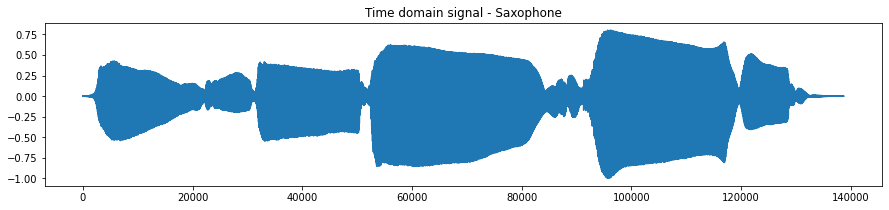

In [ ]:
fig = plt.figure(figsize=(15,3))
plt.plot(x)
plt.title('Time domain signal - Saxophone');

STFT with Blackman window


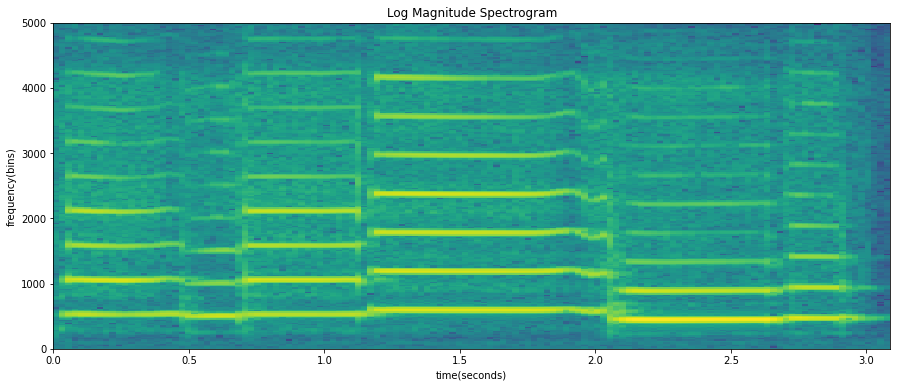

In [ ]:
axis_limits = {'y':(0, 5000)}
print('STFT with Blackman window')
plot_spectrogram(x, windowFunction='blackman', windowSize=2048, hopSize=1024, fftN=2048, axis_limits=axis_limits)

Let's also plot the spectrum of a portion of the signal

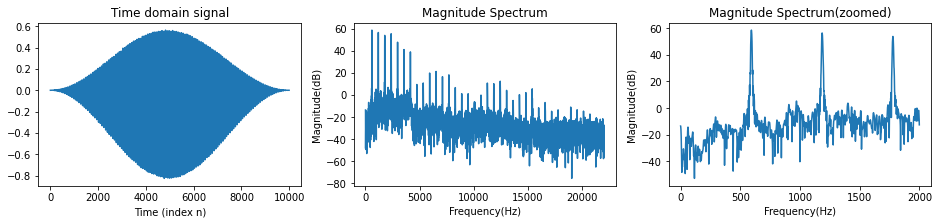

In [ ]:
x_note1 = x[60000:70000]
w = get_window('hann', x_note1.size)
x_note1_w = x_note1 * w

fftN = fs
mag_spec_note1 = log_magnitude_spectrum(x_note1_w, fftN)

fig = plt.figure(figsize=(16,3))
plt.subplot(1,3,1)
plt.plot(x_note1_w)
plt.title('Time domain signal');
plt.xlabel('Time (index n)')
plt.subplot(1,3,2)
plt.title('Magnitude Spectrum');
plt.plot(mag_spec_note1)
plt.xlabel('Frequency(Hz)')
plt.ylabel('Magnitude(dB)')
plt.subplot(1,3,3)
plt.plot(mag_spec_note1[:2000])
plt.xlabel('Frequency(Hz)')
plt.ylabel('Magnitude(dB)')
plt.title('Magnitude Spectrum(zoomed)');

Upto this point we have only considered representing amplitude in the logarithmic space, but pitch/frequency perception is also logarithmic. Let's demonstrate that. 



In [ ]:
def generate_sinusoids(frequencies, fs=16000,segment_duration=0.75):
  'Function to create a series of tones at given frequencies'
  t = np.arange(0, segment_duration, 1/fs)
  w = tukey(t.size, 0.05)#we apply tukey windowing to avoid sharp transition at concatenation boundaries
  x = np.array([])
  for freq in frequencies:
    x = np.concatenate((x, np.cos(2 * np.pi * freq * t) * w))
  return x

Creating tones with geometric series of frequencies 

In [ ]:
num_notes_in_octave = 12
k = pow(2, 1/num_notes_in_octave)
log_frequencies = [220*pow(k,i) for i in range(num_notes_in_octave * 2 + 1)]
log_freq_audio = generate_sinusoids(log_frequencies)
print('Frequencies', log_frequencies)
IPython.display.Audio(log_freq_audio, rate=fs)

Frequencies [220.0, 233.08188075904496, 246.94165062806206, 261.6255653005987, 277.18263097687213, 293.66476791740763, 311.126983722081, 329.62755691287003, 349.228231433004, 369.9944227116345, 391.9954359817495, 415.30469757994535, 440.00000000000017, 466.16376151809015, 493.8833012561244, 523.2511306011976, 554.3652619537446, 587.3295358348155, 622.2539674441623, 659.2551138257404, 698.4564628660085, 739.9888454232695, 783.9908719634993, 830.609395159891, 880.000000000001]


Creating tones with linear series of frequencies 

In [ ]:
diff = log_frequencies[1] - log_frequencies[0]
linear_frequencies = [220+ diff * i for i in range(num_notes_in_octave * 2 + 1)]
linear_freq_audio = generate_sinusoids(linear_frequencies)
print('Frequencies', linear_frequencies)
IPython.display.Audio(linear_freq_audio, rate=fs)

Frequencies [220.0, 233.08188075904496, 246.16376151808993, 259.2456422771349, 272.32752303617985, 285.4094037952248, 298.4912845542698, 311.57316531331475, 324.6550460723597, 337.7369268314047, 350.81880759044964, 363.9006883494946, 376.98256910853956, 390.0644498675845, 403.1463306266295, 416.22821138567446, 429.3100921447194, 442.3919729037644, 455.47385366280935, 468.5557344218543, 481.6376151808993, 494.71949593994424, 507.8013766989892, 520.8832574580342, 533.9651382170791]


Listening to the two audio samples above, the linear frequency version sounds as if shorter steps are taken between consecutive notes towards the end of the series where in the geometric version, the series continues with similar steps. 

By late Western Classical music conventions, an octave is divided into 12 logarithmically equal parts. That's what we have applied for creating the geometric series of frequencies.  Shortly, such equal divisions of the frequency plane is abbreviated with TET (tone equal temperament)

https://en.wikipedia.org/wiki/Equal_temperament

For other tunings used in Western music, you can refer to: https://www.kylegann.com/histune.html


The commonly used tuning system 12TET with a reference tuning frequency of A4=440 has become a widely used standard and has been embedded in data storage and transfer protocol named as MIDI (Musical Instrument Digital Interface) https://en.wikipedia.org/wiki/MIDI


<img src="http://newt.phys.unsw.edu.au/jw/graphics/notesinvert.GIF" width=500/>

MIDI numbers are integer values that are mapped to the keys on the piano keyboard. Given there exists 12 notes in an octave and the reference tuning requency A4=440Hz which mapped to MIDI number 69, implement the functions below that performs conversion between frequency in Hz and MIDI number

In [ ]:
def hz_to_midi(frequency_hz):
  return 69 + np.log2(frequency_hz/440) * 12
def midi_to_hz(midi_no):
  return pow(2, ( midi_no - 69 ) / 12 ) * 440

#Testing
midi_numbers = [0, 57, 60, 69]
for midi_no in midi_numbers:
  print('Frequency of MIDI#',midi_no, '=', midi_to_hz(midi_no), 'Hz')

frequencies = [110, 220, 440]
for freq_hz in frequencies:
  print('MIDI# of ',freq_hz, ' Hz = ', hz_to_midi(freq_hz))

Frequency of MIDI# 0 = 8.175798915643707 Hz
Frequency of MIDI# 57 = 220.0 Hz
Frequency of MIDI# 60 = 261.6255653005986 Hz
Frequency of MIDI# 69 = 440.0 Hz
MIDI# of  110  Hz =  45.0
MIDI# of  220  Hz =  57.0
MIDI# of  440  Hz =  69.0


A very useful time-frequency visualisation is the piano roll visualisation where frequency plane (y axis) is discretized into midi numbers.


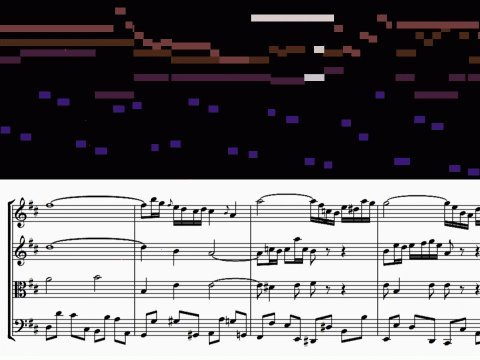

In [ ]:
from IPython.display import YouTubeVideo
#3D2 Complex sounds
YouTubeVideo('E2j-frfK-yg', width=800, height=300)

If there could be a way to map STFT (a time-frequency representation) to piano-roll, that would be great. That task refers to 'automatic music transcription' and is one of the largely studied topics in MIR. 

The frequency plane could be warped into a single octave to extract on the chroma information. Summing all energies that have the same chorma/color, we can create a chroma spectrum plot referred as the chromagram.



<img src="https://player.slideplayer.com/14/4438160/data/images/img4.jpg" width=400/>

In [ ]:
def plot_chroma(x, windowFunction, windowSize, hopSize, fftN, min_freq, max_freq, fs, use_binary = False):
  binary_threshold = 0.3

  min_freq_bin = round(min_freq * fftN / fs)
  max_freq_bin = round(max_freq * fftN / fs)

  #Create the window function
  w = get_window(windowFunction, windowSize)

  #Compute required parameters for windowing
  startIndexes = np.arange(0, x.size - windowSize, hopSize, dtype = int)
  numWindows = startIndexes.size

  #Write the code to compute spectrogram (mX) in the form of a matrix
  # - perform windowing and use the logMagnitudeSpectrum function to compute the spectrum for each frame
  chroma = []
  for k in range(numWindows):
      startInd = startIndexes[k]
      x_win = x[startInd:startInd + windowSize] * w
      linear_spec = np.power(10, log_magnitude_spectrum(x_win, fftN) /20 )#better view with linear amplitude values
      bandEnergies = np.zeros((12,))
      for freqBin in np.arange(min_freq_bin,max_freq_bin):
          # Write the code that maps freqBin to an integer midiNumber and adds
          # the amplitude of the spectrum at that bin at the 
          # corresponding component of 'bandEnergies' array
          freqBinHz = freqBin * fs / fftN
          binMidi = int(np.round(hz_to_midi(freqBinHz)))
          bandEnergies[np.mod(binMidi,12)] += linear_spec[freqBin]
      bandEnergies = bandEnergies / np.sum(bandEnergies)
      if use_binary:
        bandEnergies[bandEnergies < binary_threshold ] = 0
        bandEnergies[bandEnergies >= binary_threshold ] = 1

      chroma.append(bandEnergies)
  chroma = np.array(chroma) 
  pitchClasses = ['C', 'Db', 'D', 'Eb', 'E', 'F', 'Gb', 'G', 'Ab','A', 'Bb', 'B']

  fig = plt.figure(figsize = (20, 8))
  plt.imshow(chroma.transpose())
  #ax.tick_params(axis = 'x',which = 'both',top = 'off',bottom = 'off',labelbottom = 'off') 
  plt.title('Chromagram')
  plt.yticks(np.arange(12), pitchClasses)
  plt.ylabel('Pitch class')
  return chroma


In [ ]:
#Read and normalize the signal
fs, x = wavread('sms-tools/sounds/sax-phrase-short.wav')
x = x / np.max(np.abs(x))
IPython.display.Audio(x, rate=fs)

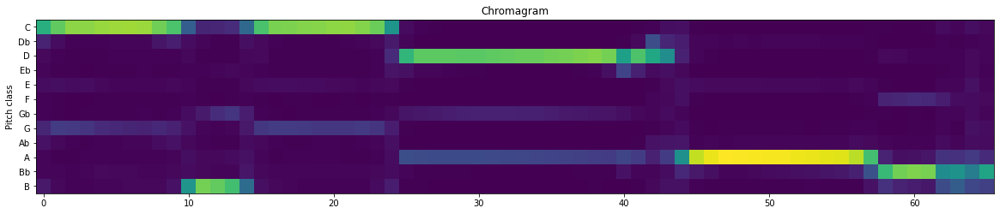

In [ ]:
#Initialize parameters
windowSize = 4096
hopSize = 2048
fftN = 4096
min_freq = 100
max_freq = 4000

plot_chroma(x, 'hann', windowSize, hopSize, fftN, min_freq, max_freq, fs);

For monophonic recordings, converting the representation in binary format might be preferable.

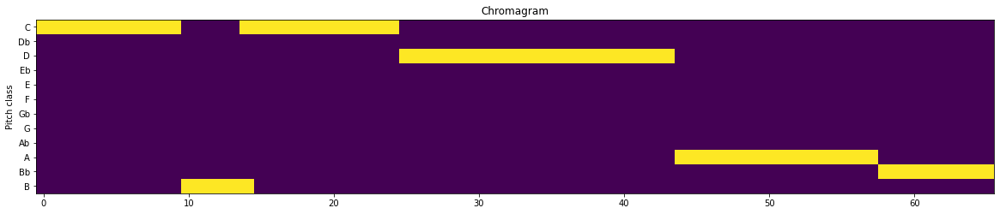

In [ ]:
plot_chroma(x, 'hann', windowSize, hopSize, fftN, min_freq, max_freq, fs, use_binary=True);

Let's plot a chromagram for a few other files. We will download some recordings from the web in the next cell. 

In [ ]:
#This cell downloads a subset of the UIOWA:MIS dataset
import urllib.request
import zipfile
import os, sys,shutil

#Links for some of files in the UIOWA:MIS dataset
links = {'flute':'http://theremin.music.uiowa.edu/sound%20files/MIS/Woodwinds/flute/flute.nonvib.ff.zip',
         'clarinet':'http://theremin.music.uiowa.edu/sound%20files/MIS/Woodwinds/Ebclarinet/EbClar.ff.zip'}

main_data_dir = 'instrument'
if not os.path.exists(main_data_dir):#creating the directory if not exist
    os.mkdir(main_data_dir)
for instrument, url in links.items():
    print('Downloading file for ', instrument)
    targetDir = os.path.join(main_data_dir,instrument)
    if not os.path.exists(targetDir):#creating the director
        os.mkdir(targetDir)
    filename = url.split('/')[-1]
    urllib.request.urlretrieve(url,filename)
    #Unzipping to a specific folder
    zip_ref = zipfile.ZipFile(filename, 'r')
    zip_ref.extractall(targetDir)
    zip_ref.close()
    os.remove(filename)#Removing the zip file
    print('Data downloaded and unzipped to: ',targetDir)

Data downloaded and unzipped to:  instrument/flute
Data downloaded and unzipped to:  instrument/clarinet


In [ ]:
#Let's test on some other signals
x, fs = sf.read('instrument/flute/flute.nonvib.ff.C5B5.aiff')
x = x / np.max(np.abs(x))
IPython.display.Audio(x, rate=fs)

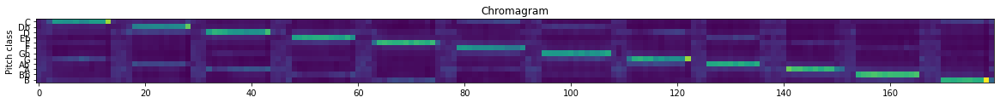

In [ ]:
#Long file, let's choose large windows and hops
windowSize = 4096 * 4
hopSize = 2048 * 4
plot_chroma(x, 'hann', windowSize, hopSize, fftN, min_freq, max_freq, fs);

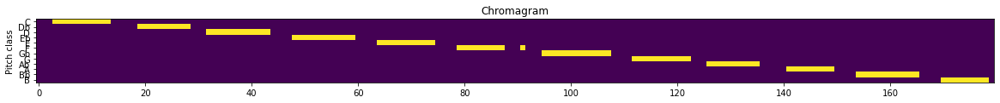

In [ ]:
plot_chroma(x, 'hann', windowSize, hopSize, fftN, min_freq, max_freq, fs, use_binary=True);

In [ ]:
urllib.request.urlretrieve('https://d33wubrfki0l68.cloudfront.net/076d85706126547b668e9159d819af5c59a18b34/905dd/mp3/c-major-scale.mp3','c-major-scale.mp3')
os.system('ffmpeg -i c-major-scale.mp3 -vn -acodec pcm_s16le -ac 1 -ar 44100 -f wav c-major-scale.wav')
x, fs = sf.read('c-major-scale.wav')
x = x / np.max(np.abs(x))
IPython.display.Audio(x, rate=fs)

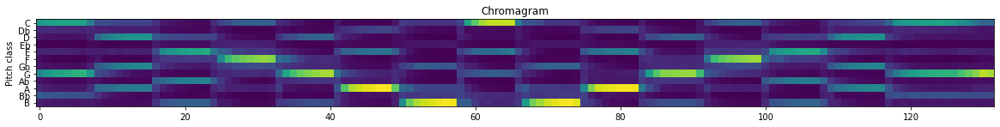

In [ ]:
windowSize = 4096
hopSize = 2048
plot_chroma(x, 'hann', windowSize, hopSize, fftN, min_freq, max_freq, fs);

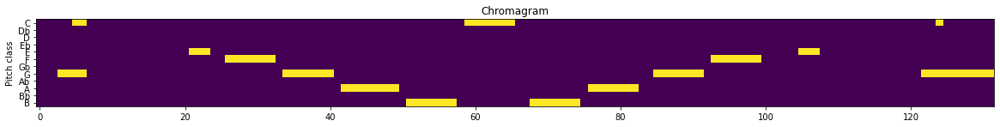

In [ ]:
plot_chroma(x, 'hann', windowSize, hopSize, fftN, min_freq, max_freq, fs, use_binary=True);

For this example, binarisation causes loss of information

# Key detection

Key detection refers to automatic detection if an audio signal is in Eminor or A major, or ... one fo the other 24 major/minor keys. 


<img src="https://i.stack.imgur.com/XqAio.png" width=400/>


The Krumhansl-Schmuckler Key-Finding Algorithm is one way to detect key. It basically relies on the template matching strategy for automatic classification

http://davidtemperley.com/wp-content/uploads/2015/11/temperley-mp99.pdf

Let's use the key profiles specified on: https://github.com/alexanderlerch/pyACA/blob/master/pyACA/computeKey.py and implement a simple version of the key detection algorithm

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  if sys.path[0] == '':


Text(0.5, 0, 'Scale degrees (1 to 12)')

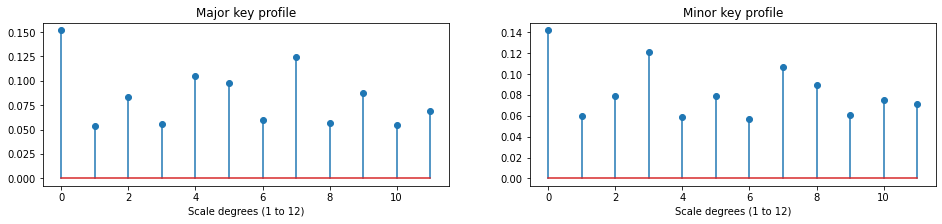

In [ ]:
key_profile_major = np.array([6.35, 2.23, 3.48, 2.33, 4.38, 4.09, 2.52, 5.19, 2.39, 3.66, 2.29, 2.88])
key_profile_major = key_profile_major / np.sum(key_profile_major)#normalisation
key_profile_minor = np.array([6.33, 2.68, 3.52, 5.38, 2.60, 3.53, 2.54, 4.75, 3.98, 2.69, 3.34, 3.17])
key_profile_minor = key_profile_minor / np.sum(key_profile_minor)#normalisation

fig = plt.figure(figsize=(16,3))
plt.subplot(1,2,1)
plt.stem(key_profile_major)
plt.title('Major key profile');
plt.xlabel('Scale degrees (1 to 12)')
plt.subplot(1,2,2)
plt.stem(key_profile_minor)
plt.title('Minor key profile');
plt.xlabel('Scale degrees (1 to 12)')

In [ ]:
#Downloading data from arcihve.org, converting mp3 to .wav
#url = 'https://archive.org/download/cd_melody-in-f_anton-rubinstein-antonn-dvok-christian-sin/disc1/03.%20Felix%20Mendelssohn%20-%20Songs%20Without%20Words%2C%20E%20major%2C%20op.%2019%20no.%201_sample.mp3'
#urllib.request.urlretrieve(url,'Mendelssohn_Emajor_sample.mp3')
url = 'https://archive.org/download/cd_the-sonatas-and-partitas-for-violin-solo_johann-sebastian-bach-gidon-kremer/disc1/01.05.%20Johann%20Sebastian%20Bach%20-%20Partita%20no.%201%20for%20Violin%20Solo%20in%20B%20minor%2C%20BWV%201002%20-%20I.%20Allemanda_sample.mp3'
urllib.request.urlretrieve(url,'ViolinSolo_Bminor_sample.mp3')
#Conversion from mp3 to wav
#os.system('ffmpeg -i Mendelssohn_Emajor_sample.mp3 -vn -acodec pcm_s16le -ac 1 -ar 44100 -f wav Mendelssohn_Emajor_sample.wav')
os.system('ffmpeg -i ViolinSolo_Bminor_sample.mp3 -vn -acodec pcm_s16le -ac 1 -ar 44100 -f wav ViolinSolo_Bminor_sample.wav')


0

In [ ]:
x, fs = sf.read('ViolinSolo_Bminor_sample.wav')
x = x / np.max(np.abs(x))
IPython.display.Audio(x, rate=fs)

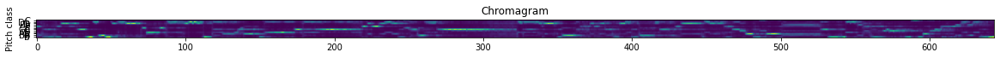

In [ ]:
#Computing chroma
windowSize = 4096
hopSize = 2048
min_freq = 100
max_freq = 2000
chroma = plot_chroma(x, 'hann', windowSize, hopSize, fftN, min_freq, max_freq, fs);

The chromagram is a (num_window, 12) sized matrix. Let's sum all energies in all 12 chromas.

Shape of chroma matrix: (644, 12)
Shape of chroma sum vector: (12,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


Text(0.5, 0, 'Scale degrees (1 to 12)')

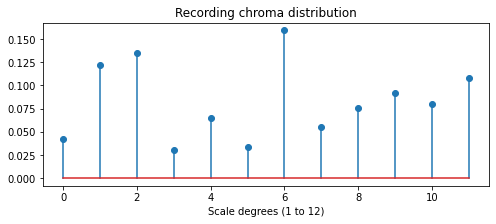

In [ ]:
print('Shape of chroma matrix:', chroma.shape)
chroma_sum = chroma.sum(axis=0)
chroma_sum = chroma_sum / np.sum(chroma_sum)#normalisation
print('Shape of chroma sum vector:', chroma_sum.shape)

fig = plt.figure(figsize=(8,3))
plt.stem(chroma_sum)
plt.title('Recording chroma distribution');
plt.xlabel('Scale degrees (1 to 12)')

Now, we will be computing the distance between the major/minor key profiles and the actual 12 dimensional chroma vector of the recording. Let's use two different norms (L1 and L2) and compare the results

In [ ]:
from numpy import linalg as LA

for norm_val in [1,2]:
  print('Computation using L', norm_val, 'norm')
  all_distance = []
  for shift in range(12):
    if shift > 0:
      shifted_chroma = np.concatenate((chroma_sum[shift:], chroma_sum[:shift]))
    else:
      shifted_chroma = chroma_sum
    distance_major = LA.norm(key_profile_major - shifted_chroma, norm_val)
    all_distance.append(distance_major)
    distance_minor = LA.norm(key_profile_minor - shifted_chroma, norm_val)
    all_distance.append(distance_minor)

  #Print sorted distances
  for ind in np.argsort(all_distance):
    print(keys[ind], 'distance:\t', all_distance[ind])
  print('-------------------------------')

Computation using L 1 norm
Gb minor distance:	 0.25794866017839513
Gb major distance:	 0.2871695940133577
B minor distance:	 0.302878166004332
D major distance:	 0.33370354818642084
A major distance:	 0.3712008369000239
B major distance:	 0.40422186981591435
Eb minor distance:	 0.4148849209113215
Db minor distance:	 0.420195231803428
E major distance:	 0.42293820544628696
D minor distance:	 0.4359793460882677
G major distance:	 0.44364222856546665
Bb minor distance:	 0.44957975623441504
Ab minor distance:	 0.4766758042826764
Db major distance:	 0.48026558405145586
E minor distance:	 0.5127350044453798
G minor distance:	 0.5277644338349543
A minor distance:	 0.5442723429515
F major distance:	 0.5721860016060084
F minor distance:	 0.5836344176057732
C minor distance:	 0.600649231545006
Bb major distance:	 0.6037940346102786
Ab major distance:	 0.6039824557444994
C major distance:	 0.6140179165290943
Eb major distance:	 0.6618910463164064
-------------------------------
Computation using 

**Factors influencing decision:**

*   The reference tuning frequency may be other than A4=440 Hz
*   Actual note distributions may not match expected distribution
*   Higher harmonics may have too much influence
*   Template matching algorithm's inaccuracy
*   Particular chromagram computation method



References:
https://github.com/MTG/MIRCourse/blob/master/notebooks/Lecture2_step3_summingBandEnergies_solution.ipynb

For more notebooks on music representations refer to: https://www.audiolabs-erlangen.de/resources/MIR/FMP/C1/C1.html

Application of chroma in chord detection: https://github.com/MTG/MIRCourse/blob/master/notebooks/Lecture2_step4_ChordDetectionDemo.ipynb

Lectures by Alexander Lerch on Musical Key Detection:
http://www.audiocontentanalysis.org/teaching/video-lectures/videolecture-5-7/
and chrod detection:
http://www.audiocontentanalysis.org/teaching/video-lectures/videolecture-5-8
